In [1]:
import os
import matplotlib.pyplot as plt
import plotly.express as px
import torch
from datasets import load_dataset
cwd = os.getcwd()
parent = os.path.abspath(os.path.join(cwd, os.pardir))
os.chdir(parent)
from analysis.utils import load_stats, get_stats_scatter_plot, DATASET_INFO, plot_ref_images, random_select_threshold_from_cluster

/Users/furkan.dasdelen/anaconda3/envs/cytosae/lib/python3.12/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
# select from ['acevedo', 'mll23', 'bmc', 'matek', 'hehr']
dataset_name = 'mll23'
save_directory= f'out/feature_data/sae_8jsxk3co/custom/{dataset_name}'
stats = load_stats(save_directory, device="cpu")

Stats loaded from out/feature_data/sae_8jsxk3co/custom/mll23


In [3]:
# you might need to install packages to run this
# $ pip install kaleido==0.2.1
# $ conda install nbformat
get_stats_scatter_plot(stats, save_directory=save_directory)

In [4]:
n_clusters = 10
n_each_sample = 5
selected_indices = random_select_threshold_from_cluster(stats, n_clusters = n_clusters, 
                                                        mean_acts_log_threshold = -1,
                                                        sparsity_log_threshold = 0.1,
                                                        n_each_sample = n_each_sample, 
                                                        save_directory=save_directory)

In [5]:
dataset = load_dataset(**DATASET_INFO[dataset_name])
dataset = dataset.shuffle(seed=1)

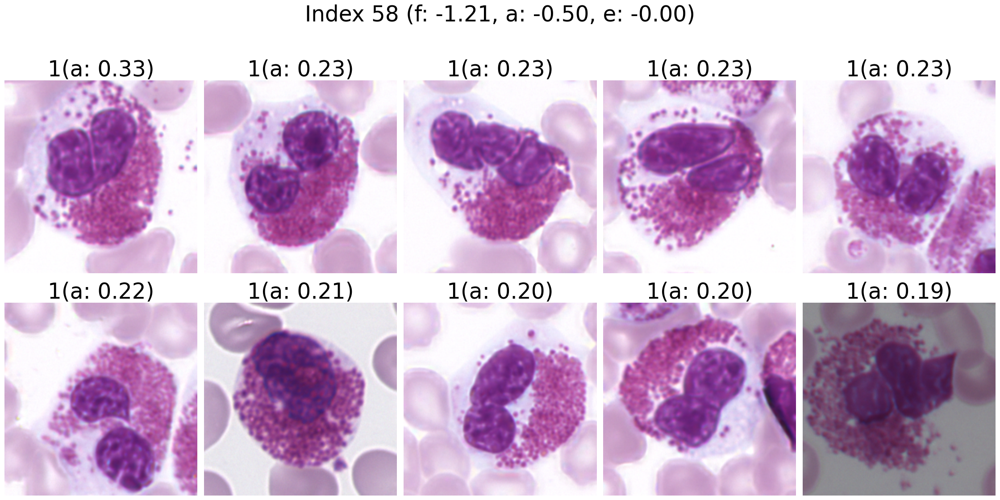

In [6]:
# Eosinophils with large eosinophilic granules
plot_ref_images(stats, dataset, latent_idx=58, plot_top_k=10)

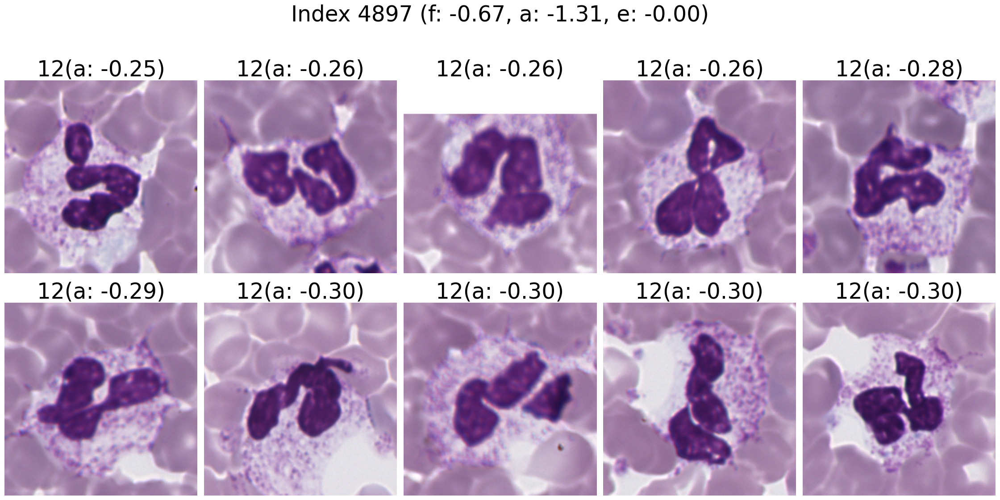

In [7]:
# Segmented neutrophil with packed erythrocytes
plot_ref_images(stats, dataset, latent_idx=4897, plot_top_k=10)